In [ ]:
pip install git+https://github.com/dr-aheydari/SoftAdapt.git

  Cloning https://github.com/dr-aheydari/SoftAdapt.git to /tmp/pip-req-build-d0kod21c
  Running command git clone --filter=blob:none --quiet https://github.com/dr-aheydari/SoftAdapt.git /tmp/pip-req-build-d0kod21c
  Resolved https://github.com/dr-aheydari/SoftAdapt.git to commit 5fc955f424052cc94824d7ba9d7e7ea564c8e254
  Preparing metadata (setup.py) ... done
  Created wheel for softadapt: filename=softadapt-0.0.5-py3-none-any.whl size=15183 sha256=498b40d21e98d86683211d9b9a166d4a8434af036f9fcd6f6e4a5f739fec6c15
  Stored in directory: /tmp/pip-ephem-wheel-cache-4rv3jc1v/wheels/d1/be/a6/ec235953fe96a72a3a6b4da3fe87a8fd3e2a73ce6f347b1c43
Successfully built softadapt


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
import torch.optim as optim
from cylinder_channel_geometry import *
from cylinder_channel_exact_solutions import *
from torch.optim.lr_scheduler import StepLR
from softadapt import SoftAdapt, NormalizedSoftAdapt, LossWeightedSoftAdapt
import torch.nn.init as init

In [38]:
# Set geometric parameters.

# Grid
grid_length_x = 10
grid_length_y = 5
grid_nr_xs = 100
grid_nr_ys = 50

# Cylinder
cylinder_radius = 0.125
cylinder_center = (0, 0)
nr_samples_on_cylinder = 100

make_plots = True

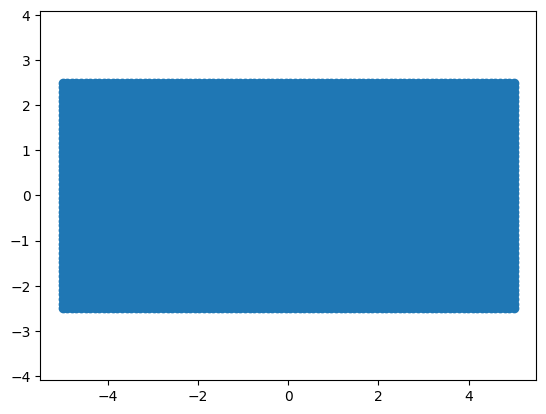

In [39]:
# Get grid.
grid = make_grid(
    x_length=grid_length_x,
    y_length=grid_length_y,
    nr_xs=grid_nr_xs,
    nr_ys=grid_nr_ys,
    make_plot=make_plots
)

In [40]:
# Get grid xs and ys.
xs, ys = grid

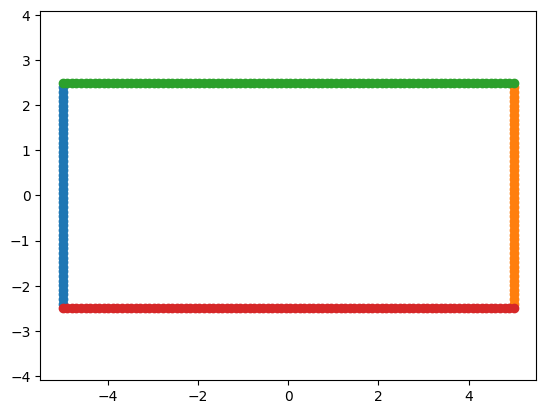

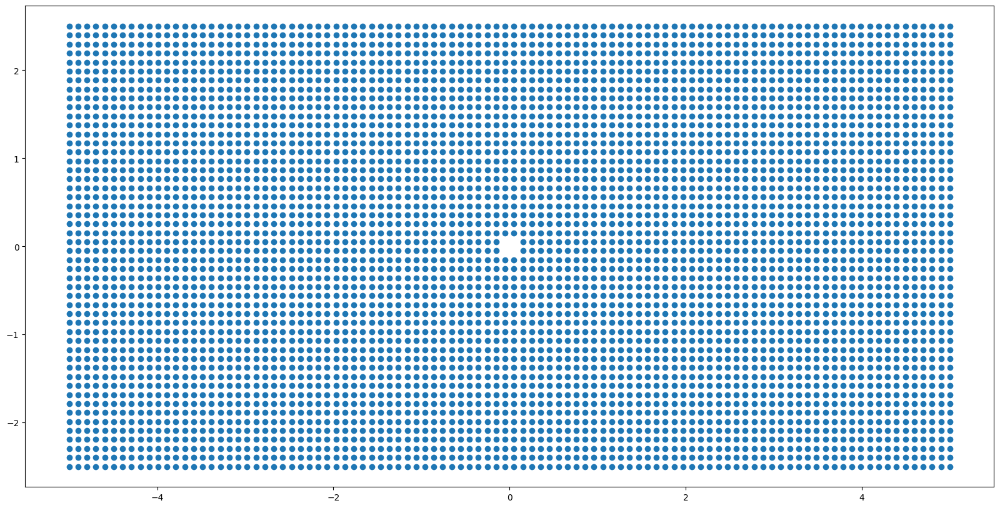

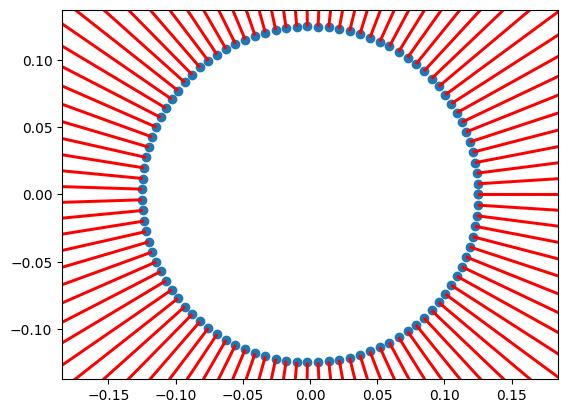

In [44]:
# Sample channel boundary.
inlet_xys, outlet_xys, left_wall_xys, right_wall_xys = sample_channel_boundary(grid, make_plots)

# Sample grid without cylinder.
channel_with_cylinder_xs, channel_with_cylinder_ys = exclude_cylinder_points(
    grid,
    cylinder_center,
    cylinder_radius,
    make_plot=make_plots)

# Sample cylinder boundary.
cylinder_boundary_xs, cylinder_boundary_ys, cylinder_normals = sample_cylinder_boundary_and_compute_normals(
    cylinder_center,
    cylinder_radius,
    nr_samples_on_cylinder,
    make_plots,
)

# Convert to tensor.
cylinder_normals_tens = torch.tensor(cylinder_normals, dtype=torch.float32)

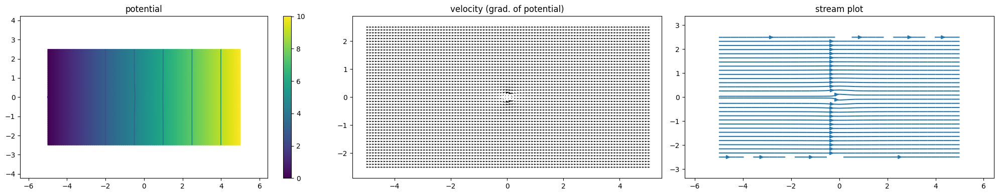

In [45]:
phi_exact, v_x_exact, v_y_exact = compute_analytical_solution(grid, U=1, R=cylinder_radius)

make_plot(phi_exact, grid, uv=(v_x_exact, v_y_exact))

In [46]:
print(phi_exact[:, -1])
print(np.shape(v_x_exact[:, 0]))
print(v_x_exact[:, 0])

[10.00562467 10.00566531 10.00570551 10.00574517 10.00578418 10.00582243
 10.0058598  10.00589617 10.00593142 10.00596542 10.00599806 10.0060292
 10.00605873 10.00608653 10.00611248 10.00613647 10.00615839 10.00617814
 10.00619564 10.00621079 10.00622354 10.00623381 10.00624156 10.00624675
 10.00624935 10.00624935 10.00624675 10.00624156 10.00623381 10.00622354
 10.00621079 10.00619564 10.00617814 10.00615839 10.00613647 10.00611248
 10.00608653 10.00605873 10.0060292  10.00599806 10.00596542 10.00593142
 10.00589617 10.0058598  10.00582243 10.00578418 10.00574517 10.00570551
 10.00566531 10.00562467]
(50,)
[0.9997     0.99968191 0.9996636  0.99964512 0.99962656 0.99960798
 0.99958947 0.99957111 0.99955299 0.99953521 0.99951787 0.99950106
 0.9994849  0.99946948 0.99945491 0.99944128 0.99942871 0.99941727
 0.99940705 0.99939814 0.99939059 0.99938449 0.99937986 0.99937675
 0.9993752  0.9993752  0.99937675 0.99937986 0.99938449 0.99939059
 0.99939814 0.99940705 0.99941727 0.99942871 0.999

In [47]:
# define network architecture

class FullyConnected(nn.Module):
  def __init__(self, n_inputs, n_hidden, n_outputs):
    super().__init__()
    self.input = nn.Sequential(
      nn.Linear(n_inputs, n_hidden),
      nn.Tanh(),
    )

    self.hidden = nn.Sequential(
      nn.Linear(n_hidden, n_hidden),
      nn.Tanh(),
      nn.Linear(n_hidden, n_hidden),
      nn.Tanh(),
      nn.Linear(n_hidden, n_hidden),
      nn.Tanh(),
      nn.Linear(n_hidden, n_hidden),
      nn.Tanh(),
    )
    for layer in self.hidden:
      if isinstance(layer, nn.Linear):
        init.xavier_uniform_(layer.weight)

    self.output = nn.Sequential(
    nn.Linear(n_hidden, n_outputs),
    )

  def forward(self, x):
    x = self.input(x)
    x = self.hidden(x)
    x = self.output(x)
    return x

In [48]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

grid_points_xys = torch.stack((torch.tensor(channel_with_cylinder_xs.compressed(), dtype=torch.float32).flatten(), torch.tensor(channel_with_cylinder_ys.compressed(), dtype=torch.float32).flatten()), 1).requires_grad_(True)
# grid_points_xys = torch.stack((torch.tensor(xs, dtype=torch.float32).flatten(), torch.tensor(ys, dtype=torch.float32).flatten()), 1).requires_grad_(True)

inlet_indices = np.where(grid_points_xys[:, 0] == -grid_length_x/2)

outlet_indices = np.where(grid_points_xys[:, 0] == grid_length_x/2)

upper_wall_indices = np.where(grid_points_xys[:, 1] == grid_length_y/2)
lower_wall_indices = np.where(grid_points_xys[:, 1] == -grid_length_y/2)

cylinder_points_xys = torch.stack((torch.tensor(cylinder_boundary_xs, dtype=torch.float32), torch.tensor(cylinder_boundary_ys, dtype=torch.float32)), 1).requires_grad_(True)

grid_points_xys = grid_points_xys.to(device)
cylinder_points_xys = cylinder_points_xys.to(device)


0.009141496382653713 0.5962969660758972 0.9771419763565063 0.00034898112062364817 0.00027165061328560114 0.0008641943568363786


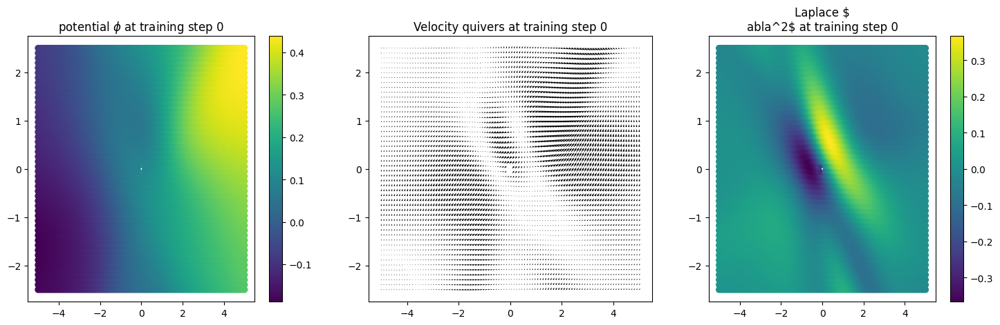

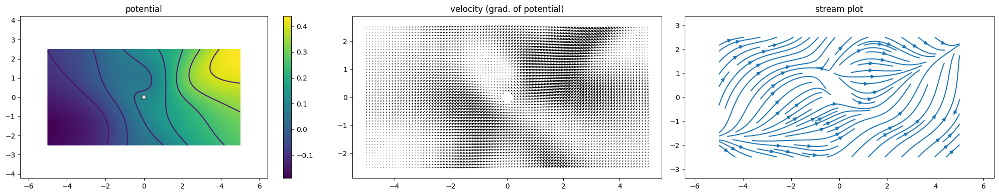

0.007075876463204622 0.00031717168167233467 0.0029660393483936787 0.004362207371741533 0.0014268183149397373 0.0028953352011740208


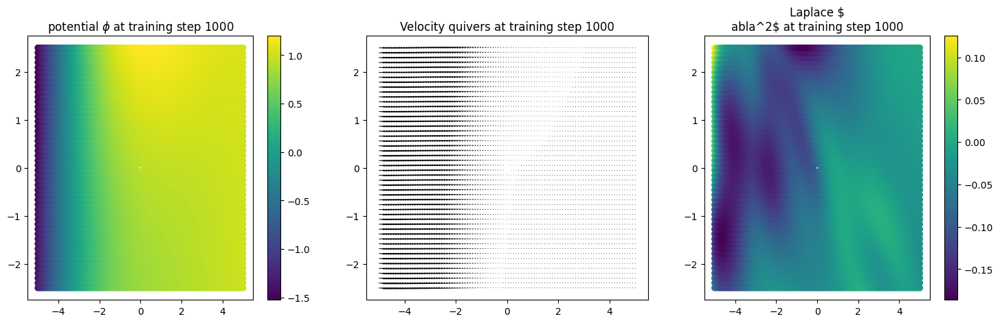

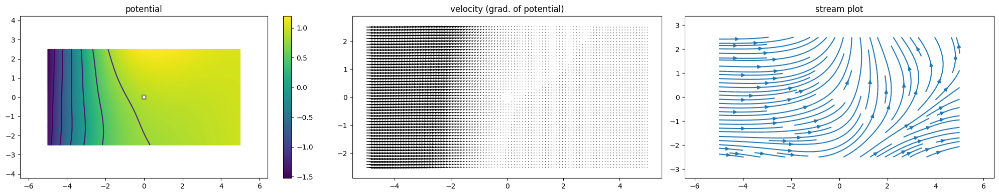

0.007956579327583313 0.0005926707526668906 0.0024149054661393166 0.002790285274386406 0.0012936816783621907 0.0027814791537821293


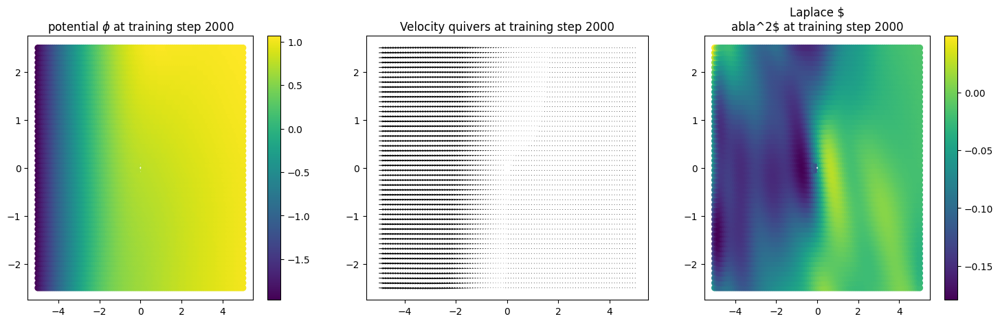

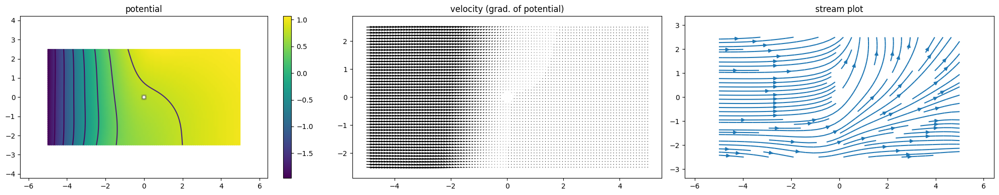

0.007347166538238525 0.000748649996239692 0.00022510686540044844 0.003961573820561171 0.0011016938369721174 0.0039617279544472694


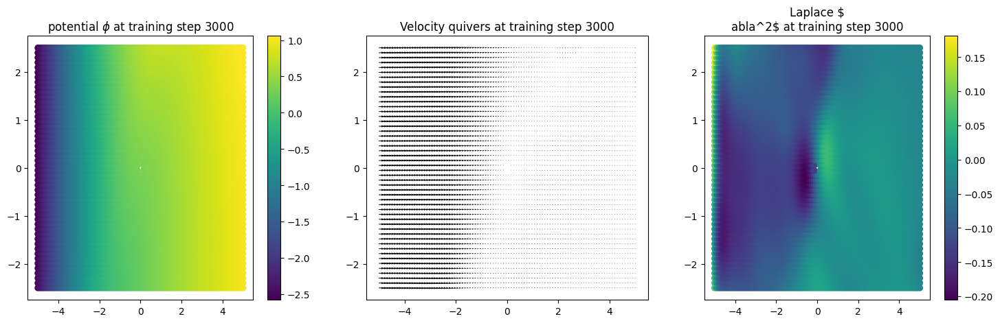

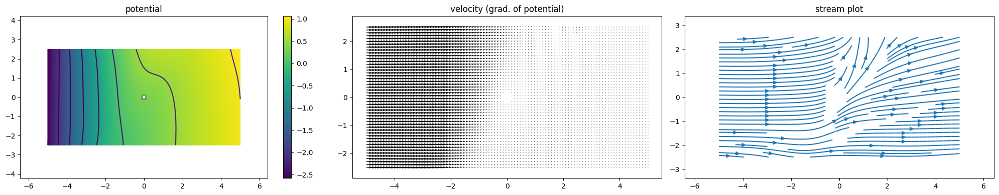

0.006026009097695351 0.0002207721263403073 0.0026749805547297 0.001785798347555101 0.0021229865960776806 0.002623799489811063


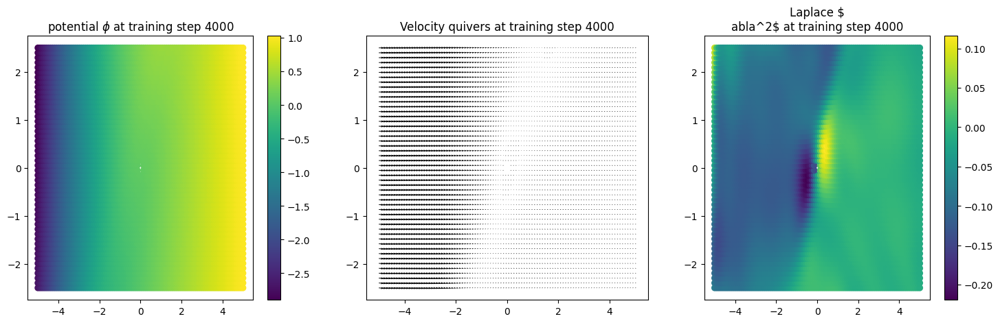

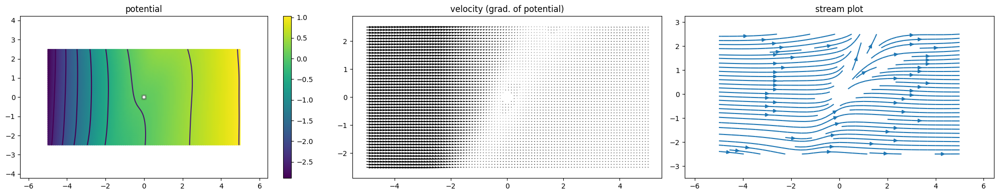

0.005847180262207985 0.00018023650045506656 0.0032452945597469807 0.002171756699681282 0.0017995929811149836 0.0026372731663286686


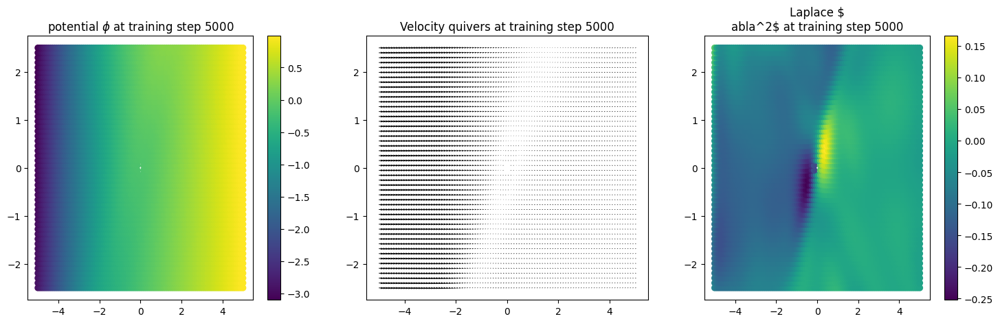

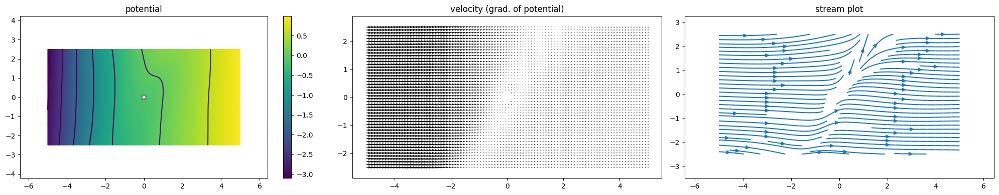

0.005906284786760807 0.00025209353771060705 0.0005359741626307368 0.0035749704111367464 0.0011308486573398113 0.004634622484445572


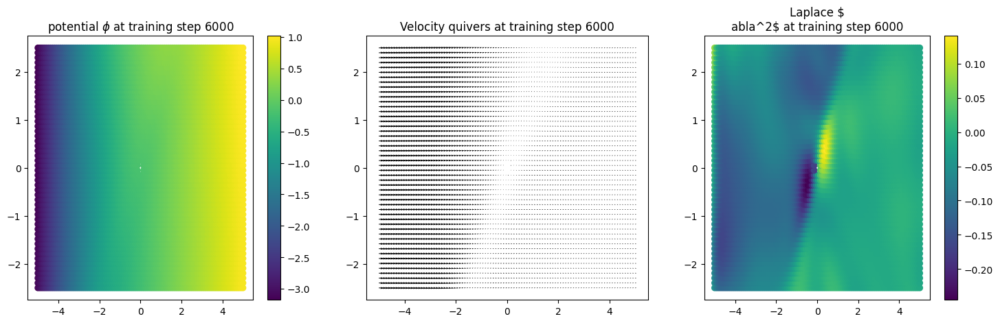

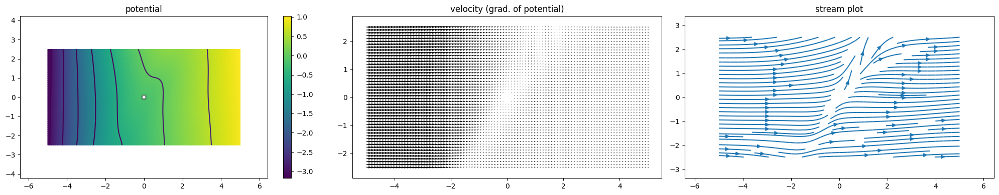

0.006028913892805576 0.00022544180683325976 0.002107919892296195 0.0017794125014916062 0.0017696715658530593 0.002462119795382023


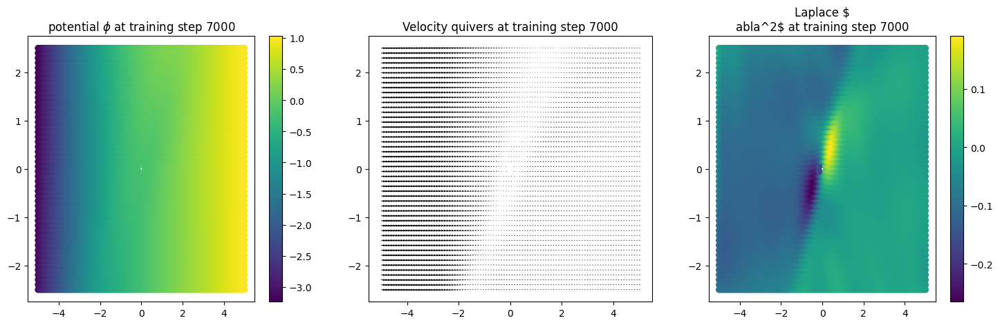

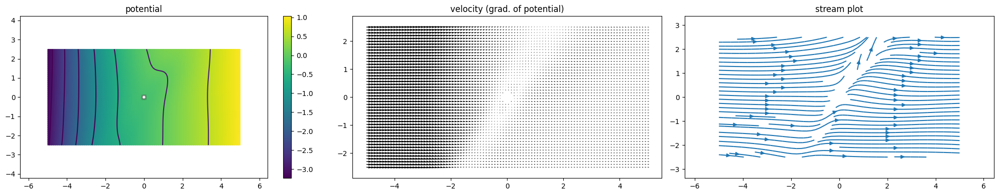

0.0060902186669409275 0.0002094517694786191 0.0015476653352379799 0.0017953228671103716 0.0014931034529581666 0.0029229694046080112


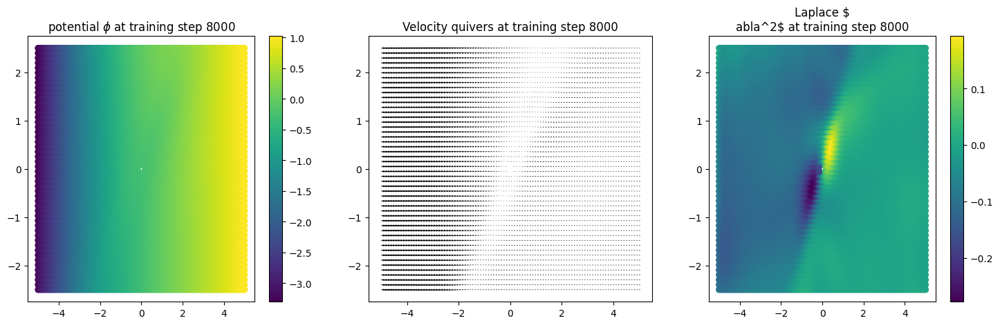

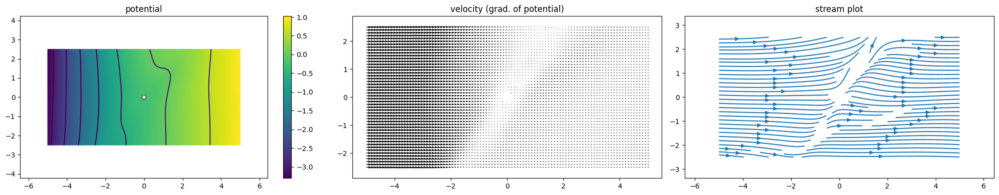

0.004821585025638342 0.0002657398581504822 0.002215632004663348 0.002867873990908265 0.0014748641988262534 0.003984986338764429


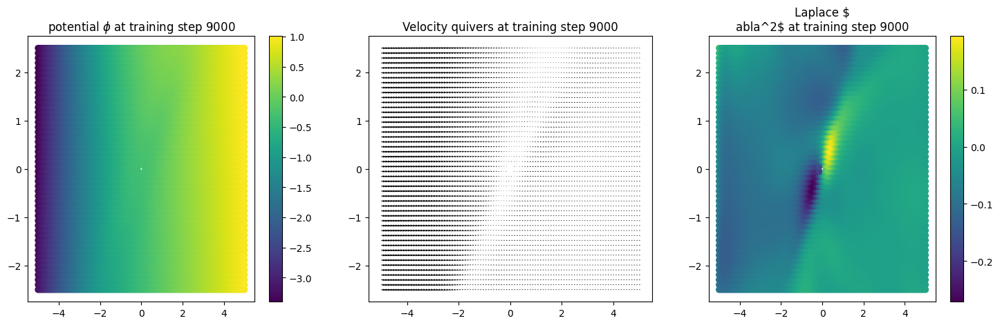

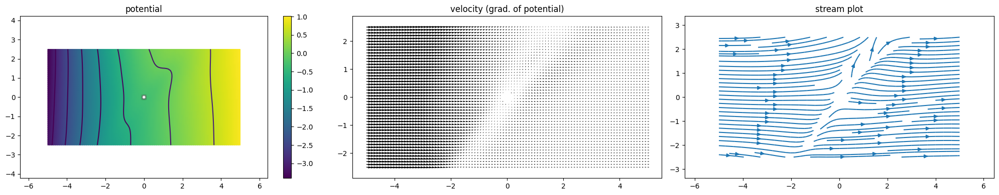

0.005264983046799898 0.00011834259930765256 0.0018839158583432436 0.002223379211500287 0.0014128321781754494 0.0035257176496088505


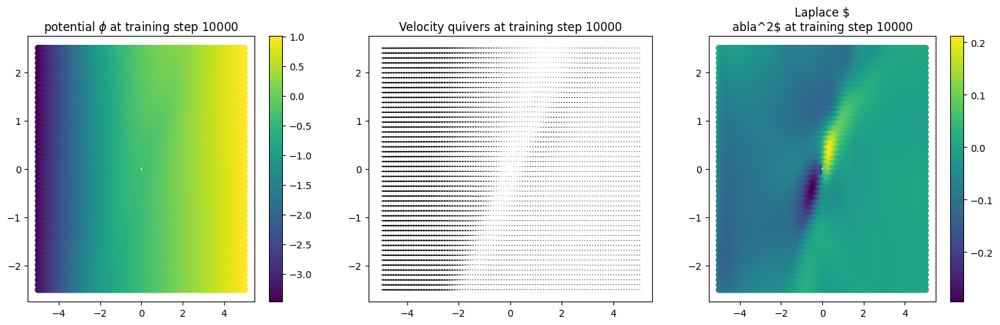

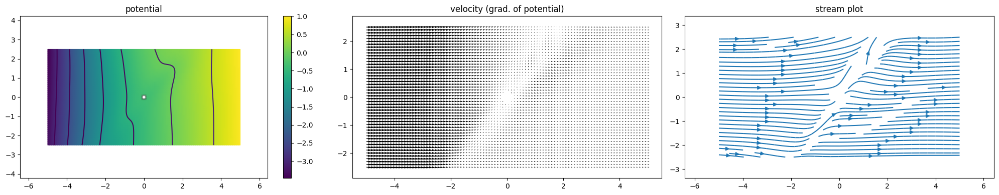

0.006448350381106138 0.00011969854676863179 0.0015210615238174796 0.0024068986531347036 0.0007079672068357468 0.0035863688681274652


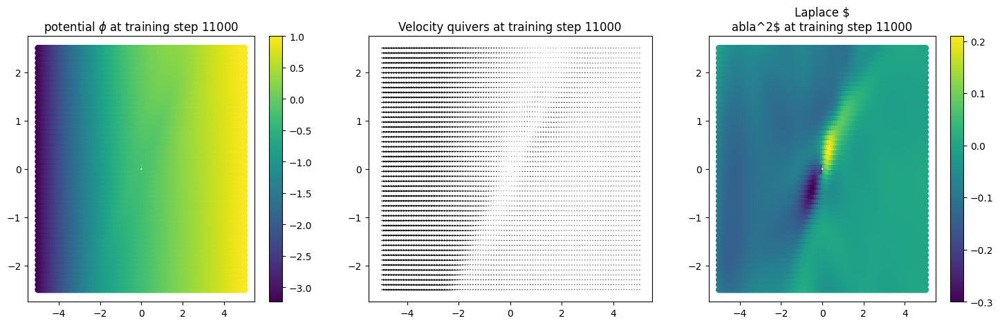

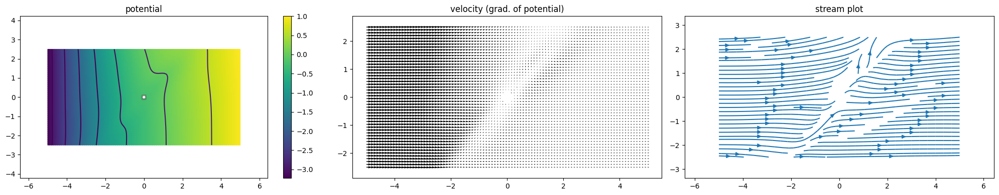

0.0075745126232504845 0.0003853818925563246 0.0017348816618323326 0.002192760817706585 0.0009484439506195486 0.003223019652068615


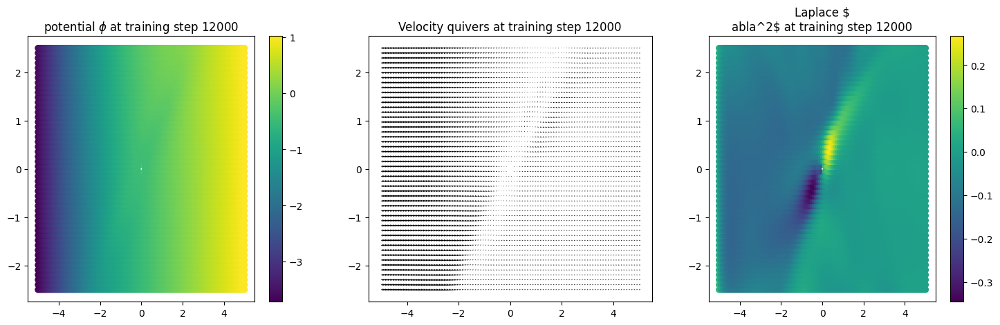

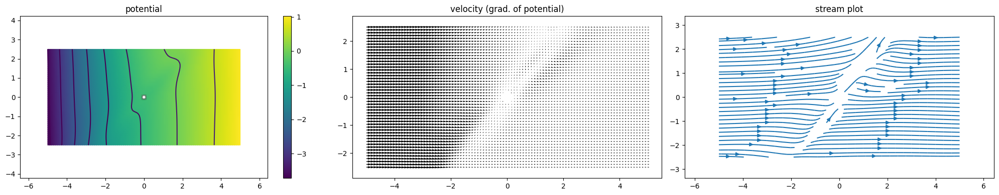

0.007799816783517599 0.0003988668031524867 0.002523573348298669 0.0023971758782863617 0.0016767309280112386 0.002269834280014038


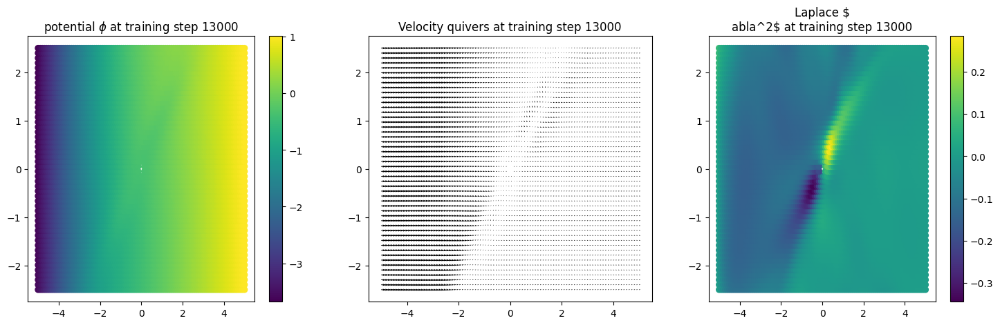

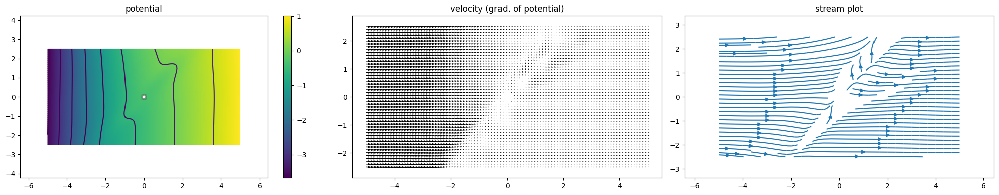

0.007484726142138243 0.00012012012302875519 0.0001468075206503272 0.0022179840598255396 0.0009883217280730605 0.0024967992212623358


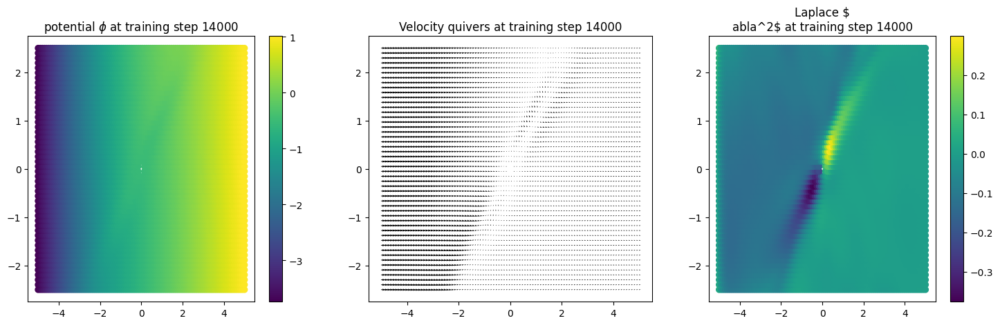

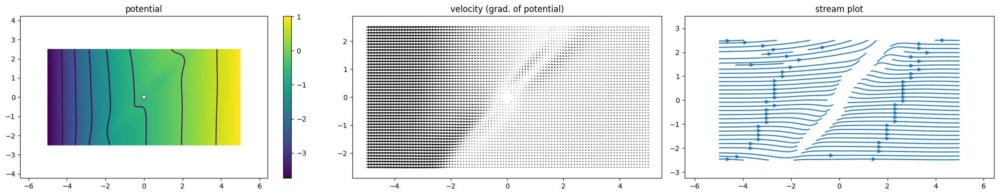

0.00574192451313138 8.169400825863704e-05 0.002558067673817277 0.001899206661619246 0.0020468553993850946 0.0013110095169395208


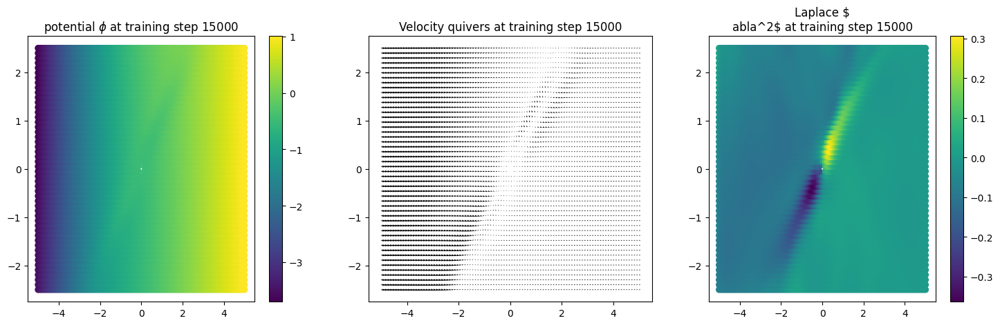

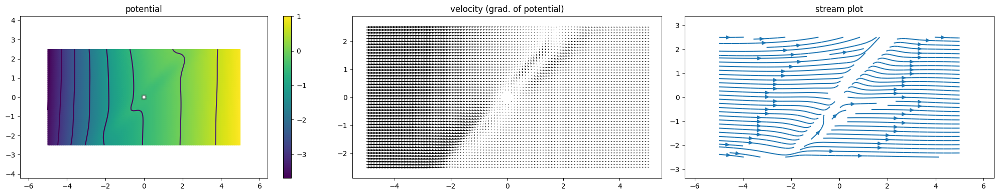

0.005266857799142599 2.9314576750039123e-05 0.001524539664387703 0.0020481408573687077 0.001218100544065237 0.003157485742121935


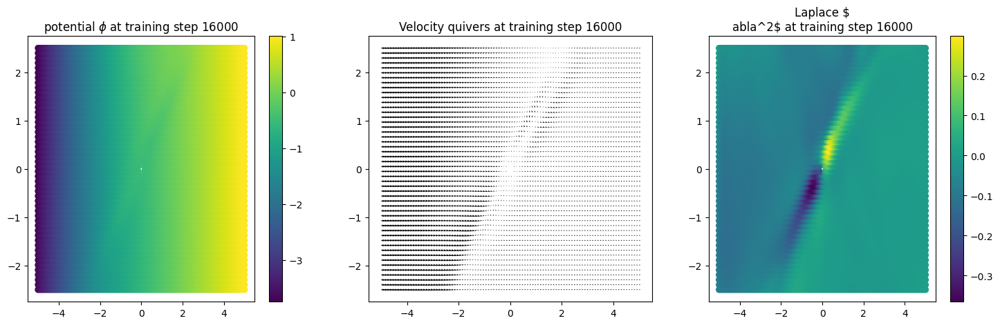

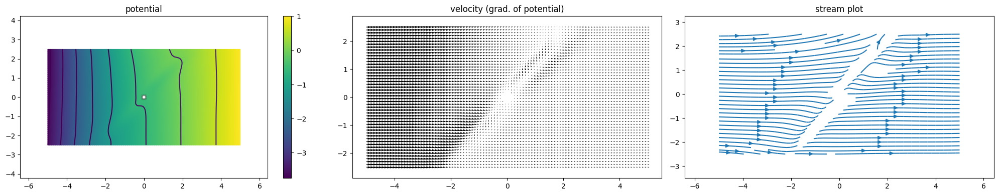

0.00535123934969306 2.7278238121652976e-05 0.002275029430165887 0.0020305465441197157 0.0018162393243983388 0.002062074141576886


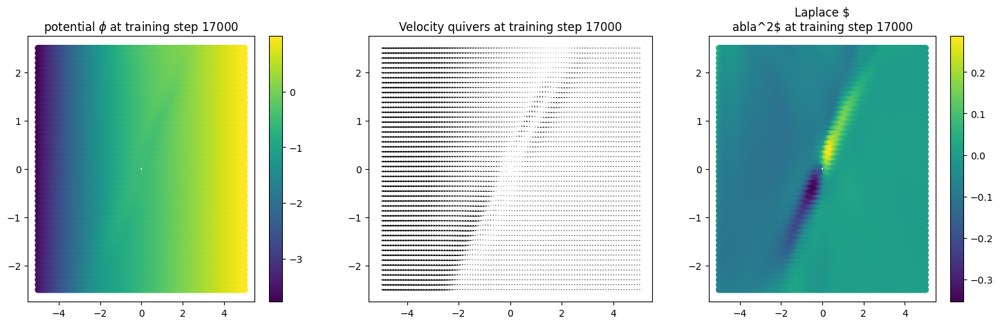

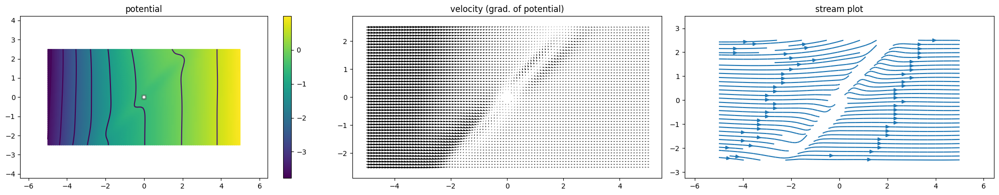

0.004705025348812342 6.424414459615946e-05 0.0035351968836039305 0.0021525719203054905 0.0012276737252250314 0.002918508369475603


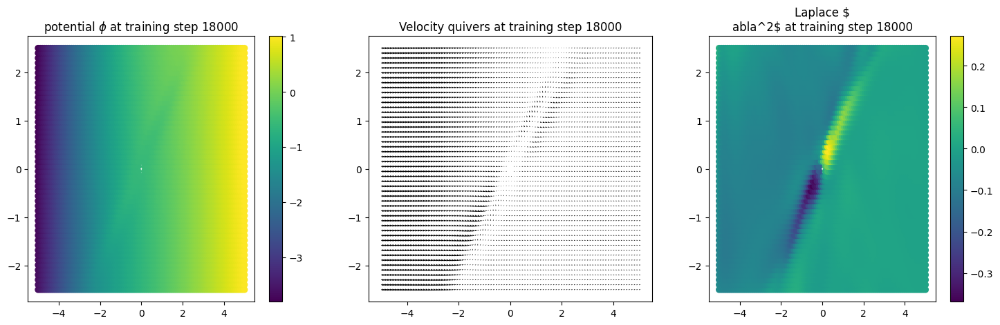

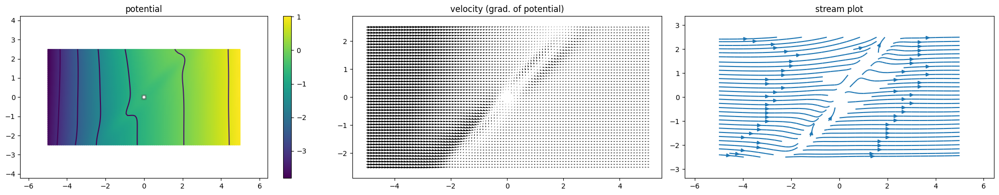

0.004753717686980963 2.6103352865902707e-05 0.002705733524635434 0.0027893981896340847 0.002090499037876725 0.0021302395034581423


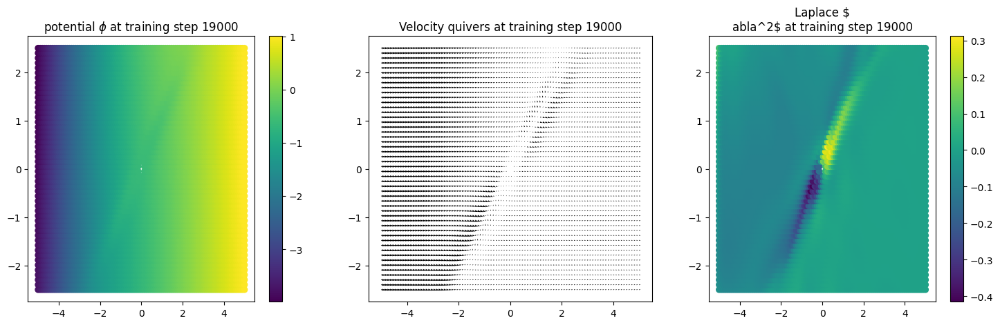

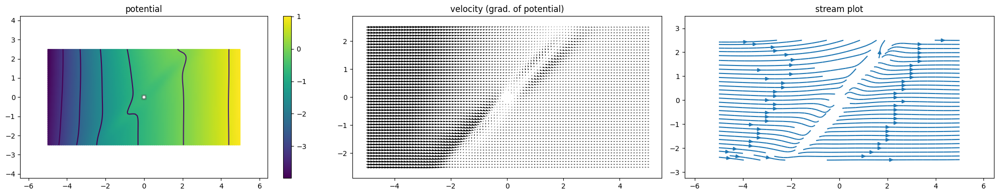

In [ ]:
# Define the architecture.
torch.manual_seed(0)

pinn = FullyConnected(2, 32, 1)
pinn.to(device)

# Set optimizer
optimizer = torch.optim.Adam(pinn.parameters(), lr=1e-3)
scheduler = StepLR(optimizer, step_size=2000, gamma=0.9)

adaptive_weights = LossWeightedSoftAdapt(beta=1)
# initialize lists to keep track of loss values
values_of_inlet_loss = []
values_of_outlet_loss = []
values_of_pde_loss = []
values_of_upper_walls_loss = []
values_of_lower_walls_loss = []
values_of_cylinder_loss = []

# initializing adaptive weights to all ones.
adapt_weights = torch.tensor([1, 1, 1, 1, 1, 1])

nr_steps = 50000

for i in range(nr_steps + 1):
    optimizer.zero_grad()

    # Get model predictions.
    pinn_pred = pinn(grid_points_xys)

    # PDE Laplace loss Compute second order derivative.
    grad_f = torch.autograd.grad(pinn_pred, grid_points_xys, grad_outputs=torch.ones_like(pinn_pred), create_graph=True)[0]
    nabla_f = torch.autograd.grad(grad_f, grid_points_xys, grad_outputs=torch.ones_like(grad_f), create_graph=True)[0]
    residual = torch.sum(nabla_f, 1)
    pde_loss = torch.mean(residual ** 2)

    # Inlet LHS condition grad_phi = 1
    ideal_inlet_velocity_x = torch.ones(50)
    ideal_inlet_velocity_y = torch.zeros(50)

    residual_inlet_x = grad_f[inlet_indices][:, 0] - ideal_inlet_velocity_x
    residual_inlet_y = grad_f[inlet_indices][:, 1] - ideal_inlet_velocity_y
    inlet_loss = torch.mean(residual_inlet_x ** 2) + torch.mean(residual_inlet_y ** 2)

    # Outlet RHS condition phi = 1
    ideal_outlet_phi = torch.ones(50)
    residual_outlet = pinn_pred[outlet_indices] - ideal_outlet_phi
    outlet_loss = torch.mean(residual_outlet ** 2)

    # No flux walls upper
    grad_upper_wall = grad_f[upper_wall_indices]
    upper_wall_normals = torch.tensor([0, 1]).repeat(len(grad_upper_wall)).reshape(100, 2)
    residual_upper_wall = upper_wall_normals * grad_upper_wall
    upper_wall_loss = torch.mean(residual_upper_wall ** 2)

    # No flux walls lower
    grad_lower_wall = grad_f[lower_wall_indices]
    lower_wall_normals = torch.tensor([0, -1]).repeat(len(grad_lower_wall)).reshape(100, 2)
    residual_lower_wall = lower_wall_normals * grad_lower_wall
    lower_wall_loss = torch.mean(residual_lower_wall ** 2)

    # No flux cylinder
    pinn_pred_cylinder = pinn(cylinder_points_xys)
    grad_cylinder = torch.autograd.grad(pinn_pred_cylinder, cylinder_points_xys, grad_outputs=torch.ones_like(pinn_pred_cylinder), create_graph=True)[0]
    residual_cylinder = cylinder_normals_tens * grad_cylinder
    cylinder_loss = torch.mean(residual_cylinder ** 2)

    # keeping track of each loss component
    values_of_inlet_loss.append(inlet_loss)
    values_of_outlet_loss.append(outlet_loss)
    values_of_pde_loss.append(pde_loss)
    values_of_upper_walls_loss.append(upper_wall_loss)
    values_of_lower_walls_loss.append(lower_wall_loss)
    values_of_cylinder_loss.append(cylinder_loss)

    # update weights for every fifth step
    if i % 6 == 0 and i != 0:
        adapt_weights = adaptive_weights.get_component_weights(torch.tensor(values_of_pde_loss),
                                                            torch.tensor(values_of_inlet_loss),
                                                            torch.tensor(values_of_outlet_loss),
                                                            torch.tensor(values_of_upper_walls_loss),
                                                            torch.tensor(values_of_lower_walls_loss),
                                                            torch.tensor(values_of_cylinder_loss),
                                                            verbose=False
                                                            )

        # resetting the lists
        values_of_inlet_loss = []
        values_of_outlet_loss = []
        values_of_pde_loss = []
        values_of_upper_walls_loss = []
        values_of_lower_walls_loss = []
        values_of_cylinder_loss = []

    loss = (
        adapt_weights[0]*pde_loss
        + adapt_weights[1]*inlet_loss
        + adapt_weights[2]*outlet_loss
        + adapt_weights[3]*upper_wall_loss
        + adapt_weights[4]*lower_wall_loss
        + adapt_weights[5]*cylinder_loss
    )


    # Combine all the loss terms
    # loss = 1e2 * pde_loss + inlet_loss + outlet_loss + 1e2 * upper_wall_loss + 1e2 * lower_wall_loss + cylinder_loss


    loss.backward()
    optimizer.step()
    scheduler.step()

    if i % 1000 == 0:
        print(pde_loss.item(), outlet_loss.item(), inlet_loss.item(), upper_wall_loss.item(), lower_wall_loss.item(), cylinder_loss.item())
        phi = pinn(grid_points_xys).detach()
        phi_grad = grad_f.detach().numpy()
        xys = grid_points_xys.detach().numpy()
        laplace = residual.detach().numpy()

        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,5))
        m = ax1.scatter(xys[:, 0], xys[:, 1], c=phi)
        cbar = plt.colorbar(m, ax=ax1)
        # ax1.axis("equal")
        ax1.set_title(f"potential $\phi$ at training step {i}")

        m = ax2.quiver(xys[:, 0], xys[:, 1], phi_grad[:, 0], phi_grad[:, 1])
        # ax2.axis("equal")
        ax2.set_title(f"Velocity quivers at training step {i}")

        n = ax3.scatter(xys[:, 0], xys[:, 1], c=laplace)
        cbar = plt.colorbar(n, ax=ax3)
        # ax3.axis("equal")
        ax3.set_title(f"Laplace $\nabla^2$ at training step {i}")

        """
        vx = phi_grad[:, 0].reshape(50, 100)
        vy = phi_grad[:, 1].reshape(50, 100)
        ax4.streamplot(xs, ys, vx, vy)
        """
        plt.show()

        full_xys = torch.stack((torch.tensor(xs, dtype=torch.float32).flatten(), torch.tensor(ys, dtype=torch.float32).flatten()), 1)
        phi_pred = pinn(full_xys).detach().reshape((50, 100))
        for i in range(len(phi_pred)):
          for j in range(len(phi_pred[0])):
            dist_from_center = np.sqrt( xs[i][j] ** 2 + ys[i][j] **2 )
            if dist_from_center < cylinder_radius:
              phi_pred[i][j] = np.nan

        make_plot(phi_pred, grid)
        plt.show()




